# Cluster maps

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import shapely
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patches as mpatches
from core.utils import get_cluster_names
import numpy as np
from matplotlib import colormaps
from matplotlib.colors import to_hex
from matplotlib import rcParams

rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = ["Lato"]

v = "v10"

### Taxonomy across settlement hierarchy examples

In [ ]:
cluster_mapping = pd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/cluster_mapping_{v}.pq"
)

In [ ]:
# 74378 - Milevsko, Czechia
# 35141 - klagenfurt, Austria
# 107131 - Krakow, Poland
# 55763 - Berlin, Germany

centres_df = pd.DataFrame(
    (
        (49.45118, 14.36031),
        (46.62392, 14.30968),
        (50.06084, 19.93810),
        (52.49891, 13.39149),
    ),
    columns=["y", "x"],
)
centres_df = gpd.GeoSeries(
    gpd.points_from_xy(centres_df["x"], centres_df["y"], crs="epsg:4236")
).to_crs(epsg=3035)

In [ ]:
buffers = [1000, 2000, 4000, 8000]

In [ ]:
%%time

milevsko = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_74378_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
milevsko = milevsko[milevsko.within(centres_df.iloc[0].buffer(buffers[0]))]
klagenfurt = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_64220_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
klagenfurt = klagenfurt[klagenfurt.within(centres_df.iloc[1].buffer(buffers[1]))]
krakow = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_107131_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
krakow = krakow[krakow.within(centres_df.iloc[2].buffer(buffers[2]))]
berlin = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_55763_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
berlin = berlin[berlin.within(centres_df.iloc[3].buffer(buffers[3]))]

CPU times: user 4.33 s, sys: 688 ms, total: 5.02 s
Wall time: 4.75 s


In [ ]:
datalist = [milevsko, klagenfurt, krakow, berlin]

In [ ]:
def get_color(cluster, level):
    if level == 1:
        cmap = [
            "#4069BC",
            "#ECBF43",
        ]
    elif level == 2:
        cmap = ["#4069BC", "#eec1d5", "#ECBF43", "#b2cd32"]
    elif level == 3:
        cmap = [
            "#4069BC",
            "#7CBAE4",
            "#E69C63",
            "#eec1d5",
            "#E0665F",
            "#ECBF43",
            "#b2cd32",
            "#1F943E",
        ]

    else:
        raise Exception("Not defined")

    return cmap[cluster - 1]

<timed exec>:12: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
<timed exec>:12: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
<timed exec>:12: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
<timed exec>:12: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.


CPU times: user 1min 44s, sys: 129 ms, total: 1min 44s
Wall time: 1min 44s


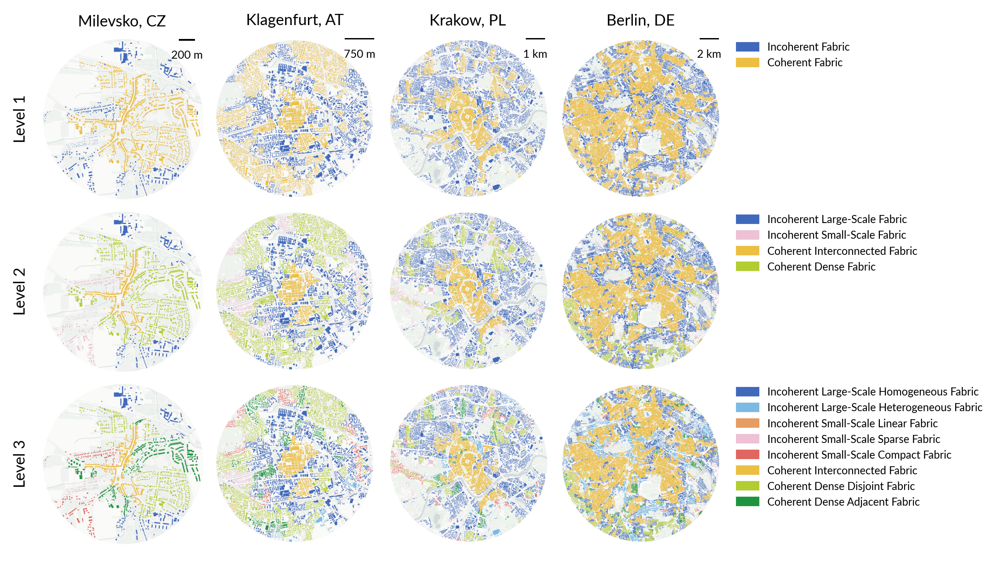

In [ ]:
%%time

levels = 3

fig, ax = plt.subplots(levels, 5, figsize=(8.3, 5), dpi=300)
for level, row_ax in enumerate(ax):
    clusters = [
        data.final_without_noise.map(cluster_mapping[level + 1].to_dict())
        for data in datalist
    ]
    unique_clusters = pd.concat(clusters, ignore_index=True).unique()

    for i, (data, col_ax) in enumerate(zip(datalist, row_ax[:-1])):
        for cluster in unique_clusters:
            data[clusters[i] == cluster].plot(
                ax=col_ax,
                color=get_color(cluster, level + 1),
                linewidth=0.05,
                edgecolor=get_color(cluster, level + 1),
            )

        cx.add_basemap(
            col_ax,
            crs=data.crs,
            source=cx.providers.CartoDB.PositronNoLabels.build_url(
                scale_factor="@2x",
            ),
            attribution="",
        )
        axis_box = shapely.box(
            col_ax.get_xlim()[0],
            col_ax.get_ylim()[0],
            col_ax.get_xlim()[1],
            col_ax.get_ylim()[1],
        )
        axis_waste = axis_box.difference(centres_df.iloc[i].buffer(buffers[i]))
        gpd.GeoSeries([axis_waste], crs=data.crs).plot(ax=col_ax, color="w")

        if level == 0:
            col_ax.add_artist(
                ScaleBar(
                    1,
                    location="upper right",
                    frameon=False,
                    font_properties={"size": 6},
                )
            )

    legend_patches = [
        mpatches.Patch(
            color=get_color(cluster, level + 1),
            label=get_cluster_names(level + 1)[cluster],
        )
        for cluster in sorted(unique_clusters)
    ]
    row_ax[-1].legend(
        handles=legend_patches, loc="upper left", frameon=False, fontsize="xx-small"
    )

ax[0][0].set_ylabel("Level 1", size="small")
ax[1][0].set_ylabel("Level 2", size="small")
ax[2][0].set_ylabel("Level 3", size="small")

ax[0][0].set_xlabel("Milevsko, CZ", size="small")
ax[0][0].xaxis.set_label_position("top")
ax[0][1].set_xlabel("Klagenfurt, AT", size="small")
ax[0][1].xaxis.set_label_position("top")
ax[0][2].set_xlabel("Krakow, PL", size="small")
ax[0][2].xaxis.set_label_position("top")
ax[0][3].set_xlabel("Berlin, DE", size="small")
ax[0][3].xaxis.set_label_position("top")

for paxis in ax.flatten():
    paxis.set_yticks([])
    paxis.set_xticks([])
    # paxis.set_frame_on(False)
    paxis.spines["top"].set_color("white")
    paxis.spines["bottom"].set_color("white")
    paxis.spines["left"].set_color("white")
    paxis.spines["right"].set_color("white")
    paxis.spines["top"].set_visible(True)
    paxis.spines["bottom"].set_visible(True)
    paxis.spines["left"].set_visible(True)
    paxis.spines["right"].set_visible(True)


fig.subplots_adjust(wspace=0.00, hspace=0.00)
fig.savefig("../data/examples.png", bbox_inches="tight")

### Large cities at level 3

In [ ]:
centres_df = pd.DataFrame(
    (
        (50.07492, 14.45385),
        (48.19451, 16.38641),
        (48.15842, 17.13337),
        (48.13696, 11.58717),
    ),
    columns=["y", "x"],
)
centres_df = gpd.GeoSeries(
    gpd.points_from_xy(centres_df["x"], centres_df["y"], crs="epsg:4236")
).to_crs(epsg=3035)

In [ ]:
buffers = [15000, 15000, 15000, 15000]

In [ ]:
prague = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_69333_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
prague = prague[prague.within(centres_df.iloc[0].buffer(buffers[0]))]
vienna = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_86873_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
vienna = vienna[vienna.within(centres_df.iloc[1].buffer(buffers[1]))]
bratislava = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_99886_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
bratislava = bratislava[bratislava.within(centres_df.iloc[2].buffer(buffers[2]))]
munich = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_38679_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
munich = munich[munich.within(centres_df.iloc[3].buffer(buffers[3]))]

In [ ]:
datalist = [prague, vienna, bratislava, munich]

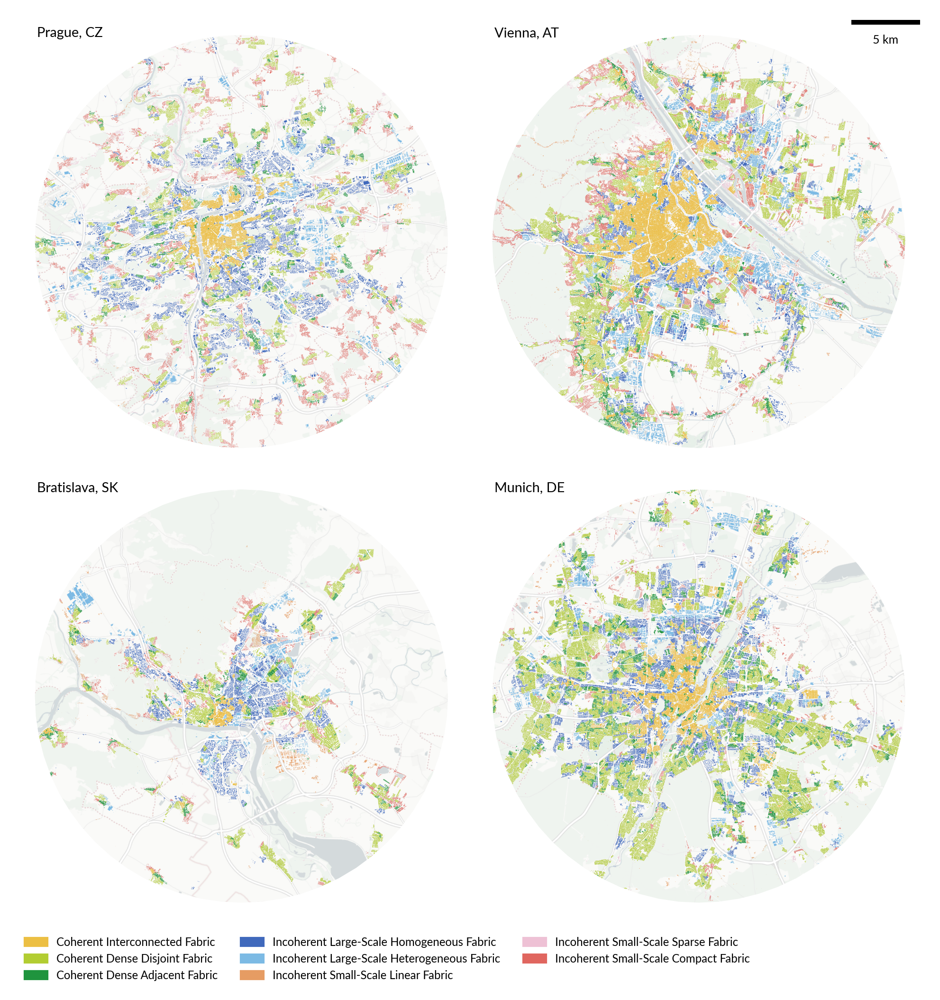

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(8.3, 8.3), dpi=300)

level = 3

clusters = [
    data.final_without_noise.map(cluster_mapping[3].to_dict()) for data in datalist
]
unique_clusters = pd.concat(clusters, ignore_index=True).unique()

for i, (data, ax) in enumerate(zip(datalist, axs.flat)):
    # ensure extent
    centres_df.iloc[[i]].buffer(buffers[i]).plot(
        ax=ax, facecolor="none", edgecolor="none"
    )

    for cluster in unique_clusters:
        data[clusters[i] == cluster].plot(
            ax=ax,
            color=get_color(cluster, level),
            linewidth=0.05,
            edgecolor=get_color(cluster, level),
        )

    cx.add_basemap(
        ax,
        crs=data.crs,
        source=cx.providers.CartoDB.PositronNoLabels.build_url(
            scale_factor="@2x",
        ),
        attribution="",
    )
    axis_box = shapely.box(
        ax.get_xlim()[0], ax.get_ylim()[0], ax.get_xlim()[1], ax.get_ylim()[1]
    )
    axis_waste = axis_box.difference(centres_df.iloc[i].buffer(buffers[i]))
    gpd.GeoSeries([axis_waste], crs=data.crs).plot(ax=ax, color="w")

    if i == 1:
        ax.add_artist(
            ScaleBar(
                1, location="upper right", frameon=False, font_properties={"size": 6}
            )
        )

    ax.set_yticks([])
    ax.set_xticks([])
    # ax.set_frame_on(False)
    ax.spines["top"].set_color("white")
    ax.spines["bottom"].set_color("white")
    ax.spines["left"].set_color("white")
    ax.spines["right"].set_color("white")
    ax.spines["top"].set_visible(True)
    ax.spines["bottom"].set_visible(True)
    ax.spines["left"].set_visible(True)
    ax.spines["right"].set_visible(True)

axs[0][0].text(0.05, 0.95, "Prague, CZ", size="x-small", transform=axs[0][0].transAxes)
axs[0][1].text(0.05, 0.95, "Vienna, AT", size="x-small", transform=axs[0][1].transAxes)
axs[1][0].text(
    0.05, 0.95, "Bratislava, SK", size="x-small", transform=axs[1][0].transAxes
)
axs[1][1].text(0.05, 0.95, "Munich, DE", size="x-small", transform=axs[1][1].transAxes)

fig.subplots_adjust(wspace=0.00, hspace=0.00)

legend_patches = [
    mpatches.Patch(
        color=get_color(cluster, level), label=get_cluster_names(level)[cluster]
    )
    for cluster in np.roll(sorted(unique_clusters), 3)
]
axs[1, 0].legend(
    handles=legend_patches,
    loc="lower left",
    frameon=False,
    fontsize="xx-small",
    ncols=3,
    bbox_to_anchor=(0, -0.15),
)
fig.savefig("../data/cities.png", bbox_inches="tight")

### Deeper Taxonomy level examples

In [ ]:
from core.cluster_validation import get_color

In [ ]:
cluster_mapping = pd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/cluster_mapping_{v}.pq"
)

In [ ]:
centres_df = pd.DataFrame(((50.08873, 14.41810),), columns=["y", "x"])
centres_df = gpd.GeoSeries(
    gpd.points_from_xy(centres_df["x"], centres_df["y"], crs="epsg:4236")
).to_crs(epsg=3035)

In [ ]:
prague = gpd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/clusters_69333_{v}.pq",
    columns=["final_without_noise", "geometry"],
)
prague = prague[prague.within(centres_df.buffer(3_500).iloc[0])]

CPU times: user 17.9 s, sys: 35 ms, total: 18 s
Wall time: 15.1 s


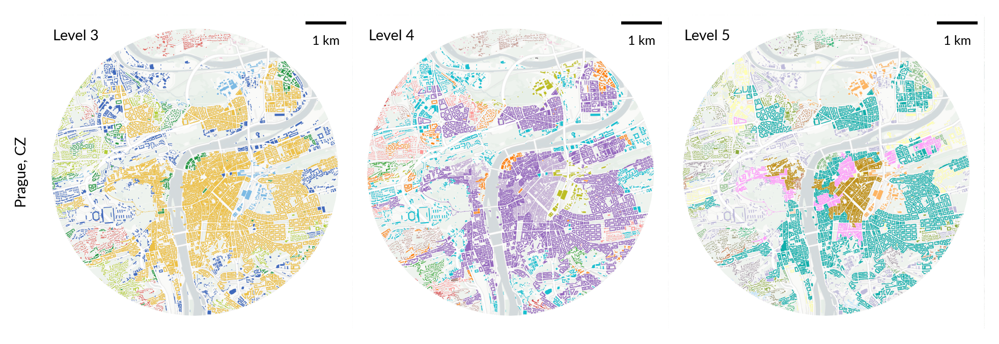

In [ ]:
%%time

levels = [3, 4, 5]

cmap = [to_hex(c) for c in colormaps.get_cmap("tab20").colors]

fig, ax = plt.subplots(1, 3, figsize=(8, 3), dpi=300)

for level, col_ax in zip(levels, ax):
    if level < 7:
        clusters = prague.final_without_noise.map(cluster_mapping[level].to_dict())
    else:
        clusters = prague.final_without_noise

    unique_clusters = clusters.unique()

    if level == 3:
        cmap = [
            None,
            "#4069BC",
            "#7CBAE4",
            "#E69C63",
            "#eec1d5",
            "#E0665F",
            "#ECBF43",
            "#b2cd32",
            "#1F943E",
        ]
    elif level <= 4:
        cmap = [to_hex(c) for c in colormaps.get_cmap("tab20_r").colors]
    else:
        cmap = [
            "#%02x%02x%02x" % (c[0], c[1], c[2])
            for c in get_color(np.arange(0, max(unique_clusters) + 1))
        ]

    for cluster in unique_clusters:
        prague[clusters == cluster].plot(
            ax=col_ax, color=cmap[cluster], linewidth=0.05, edgecolor=cmap[cluster]
        )

    cx.add_basemap(
        col_ax,
        crs=prague.crs,
        source=cx.providers.CartoDB.PositronNoLabels.build_url(
            scale_factor="@2x",
        ),
        attribution="",
    )
    axis_box = shapely.box(
        col_ax.get_xlim()[0],
        col_ax.get_ylim()[0],
        col_ax.get_xlim()[1],
        col_ax.get_ylim()[1],
    )
    axis_waste = axis_box.difference(centres_df.iloc[0].buffer(3_500))
    gpd.GeoSeries([axis_waste], crs=prague.crs).plot(ax=col_ax, color="w")
    col_ax.add_artist(
        ScaleBar(1, location="upper right", frameon=False, font_properties={"size": 6})
    )

ax[0].set_ylabel("Prague, CZ", size="x-small")

ax[0].text(0.05, 0.92, f"Level {levels[0]}", size="x-small", transform=ax[0].transAxes)
ax[1].text(0.05, 0.92, f"Level {levels[1]}", size="x-small", transform=ax[1].transAxes)
ax[2].text(0.05, 0.92, f"Level {levels[2]}", size="x-small", transform=ax[2].transAxes)

for paxis in ax.flatten():
    paxis.set_yticks([])
    paxis.set_xticks([])
    paxis.set_frame_on(False)

fig.subplots_adjust(wspace=0.00, hspace=0.00)
fig.savefig("../data/prague_taxonomy.png", bbox_inches="tight")

### Country breakdown - counts

In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np

In [ ]:
## download countries
# !wget https://gisco-services.ec.europa.eu/distribution/v2/countries/geojson/CNTR_RG_01M_2024_3035.geojson


In [ ]:
country_names = ["Germany", "Poland", "Czechia", "Slovakia", "Austria", "Lithuania"]
countries = gpd.read_file("../data/CNTR_RG_01M_2024_3035.geojson").to_crs(epsg=3035)
country_polygons = countries[countries["NAME_ENGL"].isin(country_names)]

region_hulls = gpd.read_parquet(
    "/data/uscuni-ulce/regions/cadastre_regions_hull.parquet"
)

v = "v10"
cluster_mapping = pd.read_parquet(
    f"/data/uscuni-ulce/processed_data/clusters/cluster_mapping_{v}.pq"
)

In [ ]:
region_idxs, country_idxs = country_polygons.sindex.query(
    region_hulls.geometry, predicate="intersects"
)
intersections = (
    region_hulls.iloc[region_idxs]
    .intersection(country_polygons.iloc[country_idxs], align=False)
    .area
)
intersection_df = gpd.GeoDataFrame(
    {
        "region_id": region_hulls.index[region_idxs].values,
        "country": country_polygons.iloc[country_idxs, 2].values,
        "intersection_area": intersections.values,
        "geometry": region_hulls.iloc[region_idxs, 0].values,
    },
    crs=region_hulls.crs,
)

intersection_df = intersection_df.sort_values("intersection_area", ascending=False)

In [ ]:
intersection_df.sort_values("region_id")

,region_id,country,intersection_area,geometry
0,4,Germany,3.946676e+10,"POLYGON ((4122200 3045600, 4121500 3045900, 40..."
1,10,Germany,1.495455e+09,"POLYGON ((4068900 3057300, 4051000 3064300, 40..."
2,132,Germany,1.727289e+08,"POLYGON ((4053100 3049800, 4050900 3053000, 40..."
3,134,Germany,5.064500e+07,"POLYGON ((4052500 3093600, 4052200 3093700, 40..."
4,286,Germany,5.871000e+07,"POLYGON ((4060600 3103900, 4057000 3104200, 40..."
...,...,...,...,...
921,149997,Lithuania,1.884045e+09,"POLYGON ((5253200 3642300, 5245600 3647000, 52..."
922,150044,Lithuania,2.080685e+09,"POLYGON ((5265700 3578300, 5263400 3578400, 52..."
923,151676,Lithuania,5.997051e+09,"POLYGON ((5285400 3549200, 5284800 3549900, 52..."
924,152081,Lithuania,8.335309e+09,"POLYGON ((5269700 3664900, 5269300 3665300, 52..."


In [ ]:
%%time

results = []
results_area = []

for country, group in intersection_df.groupby("country")["region_id"]:
    print(country)

    country_polygon = countries[countries["NAME_ENGL"] == country].geometry.iloc[0]
    cluster_data = pd.concat(
        [
            gpd.read_parquet(
                f"/data/uscuni-ulce/processed_data/clusters/clusters_{rid}_{v}.pq",
                columns=["final_without_noise", "geometry"],
            )
            for rid in group.values
        ],
        ignore_index=True,
    )

    within_country = cluster_data.sindex.query(country_polygon, predicate="contains")

    # save counts
    counts = cluster_data.iloc[within_country]["final_without_noise"].value_counts()
    counts.name = country
    results.append(counts)

    # save areas
    areas = (
        cluster_data.iloc[within_country]
        .groupby("final_without_noise")["geometry"]
        .apply(lambda x: x.area.sum())
    )
    areas.name = country
    results_area.append(areas)

total_counts = pd.concat(results, axis=1).fillna(0).sort_index()
total_areas = pd.concat(results_area, axis=1).fillna(0).sort_index()

Austria
Czechia
Germany
Lithuania
Poland
Slovakia
CPU times: user 3min 24s, sys: 23.2 s, total: 3min 47s
Wall time: 3min 45s


In [ ]:
level4_counts = total_counts.groupby(
    total_counts.index.map(cluster_mapping[3].to_dict()).values
).sum()
level4_counts.index = level4_counts.index.map(get_cluster_names(3))

level3_counts = total_counts.groupby(
    total_counts.index.map(cluster_mapping[3].to_dict()).values
).sum()

In [ ]:
level4_areas = total_areas.groupby(
    total_areas.index.map(cluster_mapping[3].to_dict()).values
).sum()
level4_areas.index = level4_areas.index.map(get_cluster_names(3))

In [ ]:
# proportions in brackets

r1 = (level4_counts / 1_000).astype(int)
r2 = level4_counts / level4_counts.sum(axis=0)

r3 = r1.copy().astype(str)
for i in range(r3.shape[0]):
    for j in range(r3.shape[1]):
        r3.iloc[i, j] = (
            "{:,d}".format(r1.iloc[i, j]) + " (" + "{:,.2f}".format(r2.iloc[i, j]) + ")"
        )

r3

,Austria,Czechia,Germany,Lithuania,Poland,Slovakia
Incoherent Large-Scale Homogenous Fabric,132 (0.03),247 (0.06),"1,911 (0.04)",67 (0.03),780 (0.05),137 (0.04)
Incoherent Large-Scale Heterogenous Fabric,97 (0.02),104 (0.03),"1,811 (0.04)",23 (0.01),289 (0.02),63 (0.02)
Incoherent Small-Scale Linear Fabric,223 (0.05),226 (0.05),"1,937 (0.04)",452 (0.22),"4,156 (0.27)",385 (0.11)
Incoherent Small-Scale Sparse Fabric,"1,500 (0.34)","1,102 (0.27)","3,149 (0.06)",621 (0.30),"5,122 (0.33)",234 (0.07)
Incoherent Small-Scale Compact Fabric,"1,199 (0.27)","1,078 (0.26)","6,813 (0.13)",506 (0.25),"2,510 (0.16)",730 (0.21)
Coherent Interconnected Fabric,113 (0.03),81 (0.02),"1,129 (0.02)",2 (0.00),76 (0.01),25 (0.01)
Coherent Dense Disjoint Fabric,788 (0.18),681 (0.17),"28,918 (0.56)",369 (0.18),"2,024 (0.13)","1,768 (0.51)"
Coherent Dense Adjacent Fabric,308 (0.07),609 (0.15),"5,759 (0.11)",8 (0.00),408 (0.03),91 (0.03)


In [ ]:
# areas in brackets
r1 = (level4_counts / 1_000).astype(int)
r2 = level4_areas / level4_areas.sum(axis=0)

r3 = r1.copy().astype(str)
for i in range(r3.shape[0]):
    for j in range(r3.shape[1]):
        r3.iloc[i, j] = (
            "{:,d}".format(r1.iloc[i, j]) + " (" + "{:,.2f}".format(r2.iloc[i, j]) + ")"
        )

r3

,Austria,Czechia,Germany,Lithuania,Poland,Slovakia
Incoherent Large-Scale Homogenous Fabric,132 (0.08),247 (0.15),"1,911 (0.10)",67 (0.12),780 (0.14),137 (0.12)
Incoherent Large-Scale Heterogenous Fabric,97 (0.09),104 (0.11),"1,811 (0.14)",23 (0.07),289 (0.10),63 (0.10)
Incoherent Small-Scale Linear Fabric,223 (0.04),226 (0.05),"1,937 (0.04)",452 (0.17),"4,156 (0.23)",385 (0.10)
Incoherent Small-Scale Sparse Fabric,"1,500 (0.32)","1,102 (0.24)","3,149 (0.07)",621 (0.30),"5,122 (0.28)",234 (0.07)
Incoherent Small-Scale Compact Fabric,"1,199 (0.23)","1,078 (0.22)","6,813 (0.11)",506 (0.21),"2,510 (0.13)",730 (0.17)
Coherent Interconnected Fabric,113 (0.05),81 (0.03),"1,129 (0.03)",2 (0.01),76 (0.01),25 (0.01)
Coherent Dense Disjoint Fabric,788 (0.12),681 (0.11),"28,918 (0.40)",369 (0.12),"2,024 (0.09)","1,768 (0.40)"
Coherent Dense Adjacent Fabric,308 (0.08),609 (0.10),"5,759 (0.09)",8 (0.01),408 (0.02),91 (0.03)


In [ ]:
(level4_counts.T / level4_counts.sum(axis=1)).T.style.format(precision=2)

,Austria,Czechia,Germany,Lithuania,Poland,Slovakia
Incoherent Large-Scale Homogenous Fabric,0.04,0.08,0.58,0.02,0.24,0.04
Incoherent Large-Scale Heterogenous Fabric,0.02,0.05,0.65,0.01,0.22,0.04
Incoherent Small-Scale Linear Fabric,0.04,0.04,0.76,0.01,0.12,0.03
Incoherent Small-Scale Sparse Fabric,0.03,0.03,0.26,0.06,0.56,0.05
Incoherent Small-Scale Compact Fabric,0.18,0.07,0.16,0.10,0.49,0.01
Coherent Interconnected Fabric,0.11,0.10,0.30,0.04,0.42,0.02
Coherent Dense Disjoint Fabric,0.03,0.00,0.80,0.00,0.00,0.17
Coherent Dense Adjacent Fabric,0.09,0.08,0.53,0.04,0.20,0.06
nan,0.62,0.02,0.35,0.00,0.01,0.00
nan,0.08,0.02,0.82,0.00,0.04,0.04
